In [1]:
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
import wave
import IPython

# Experimenting with DFTs and FFTs to understand them better

In [2]:
array_size = 512

def window(x : np.float64) -> np.float64:
    f = x / np.pi
    return 2-f if f > 1 else f

def func(x : np.float64) -> np.float64:
    return window(x) * ( 0.6 * np.cos(5 * x) + 0.4 * np.sin(30 * x) ) 

ff = np.vectorize(func)

In [3]:
signal = ff(np.arange(array_size) * 2 * np.pi / array_size)
signal

array([ 0.00000000e+00,  2.90167532e-03,  6.75086955e-03,  1.10994494e-02,
        1.53139475e-02,  1.87010557e-02,  2.06502818e-02,  2.07675737e-02,
        1.89746527e-02,  1.55541220e-02,  1.11292887e-02,  6.57867745e-03,
        2.89661911e-03,  1.02118895e-03,  1.65746812e-03,  5.12639103e-03,
        1.12667979e-02,  1.94109811e-02,  2.84430051e-02,  3.69360268e-02,
        4.33517514e-02,  4.62741257e-02,  4.46422320e-02,  3.79454010e-02,
        2.63473479e-02,  1.07153154e-02, -7.45640664e-03, -2.62235037e-02,
       -4.34483947e-02, -5.71025970e-02, -6.55717778e-02, -6.79178610e-02,
       -6.40565965e-02, -5.48194800e-02, -4.18845449e-02, -2.75792203e-02,
       -1.45775066e-02, -5.53036244e-03, -2.67984949e-03, -7.51233097e-03,
       -2.05028792e-02, -4.09921591e-02, -6.72196985e-02, -9.65159064e-02,
       -1.25632422e-01, -1.51169623e-01, -1.70044487e-01, -1.79933884e-01,
       -1.79629309e-01, -1.69249142e-01, -1.50272717e-01, -1.25384426e-01,
       -9.81425662e-02, -

<Axes: xlabel='time', ylabel='amplitude'>

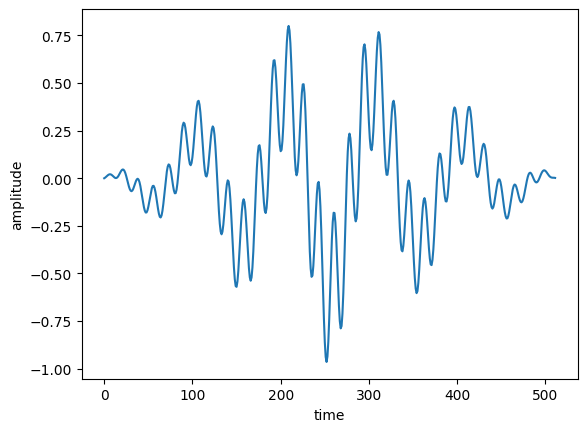

In [4]:
plot = sb.lineplot(signal)
plot.set_xlabel('time')
plot.set_ylabel('amplitude')
plot

In [5]:
def get_dft(signal):
    N = len(signal)
    dft = np.zeros(N, dtype=np.complex64)
    for k in range(N):
        val = 0
        for n in range(N):
            val += signal[n] * np.exp(-2 * 1j * np.pi * k * n / N)
        dft[k] = val
    return dft

def get_idft(freq):
    N = len(freq)
    sig = np.zeros(N, dtype=np.complex64)
    for k in range(N):
        val = 0
        for n in range(N):
            val += freq[n] * np.exp(2 * 1j * np.pi * k * n / N)
        sig[k] = val / N
    return sig

In [6]:
dft = get_dft(signal)

<Axes: >

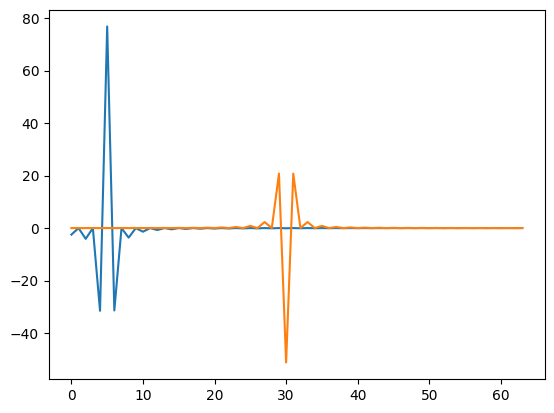

In [7]:
plot = plt.subplot(111)
sb.lineplot(np.real(dft[:len(dft)//8]), ax=plot)
sb.lineplot(np.imag(dft[:len(dft)//8]), ax=plot)
#plt.vlines([5.5, 30], ymin=-120, ymax=120, linestyles='dashed')

In [8]:
fft = np.fft.fft(signal, n=len(signal))

<Axes: >

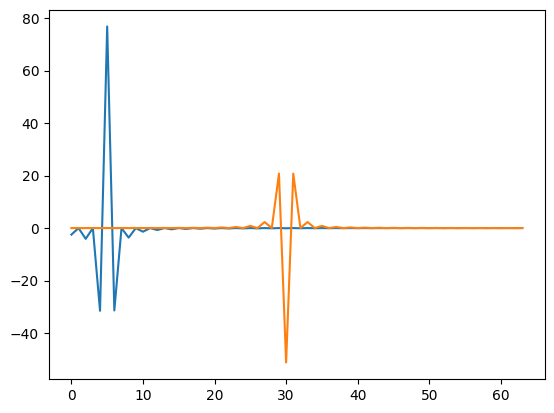

In [9]:
plot = plt.subplot(111)
sb.lineplot(np.real(fft[:len(fft)//8]), ax=plot)
sb.lineplot(np.imag(fft[:len(fft)//8]), ax=plot)

In [10]:
idft = get_idft(dft)

<Axes: >

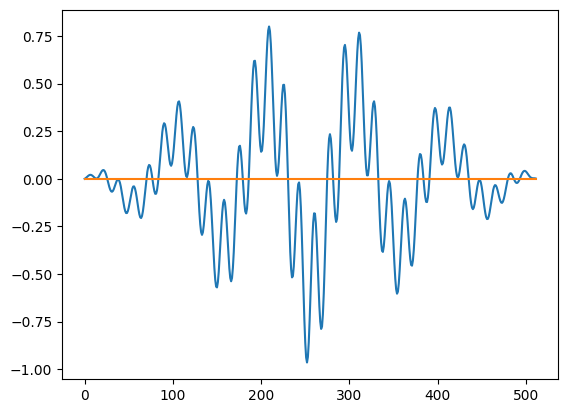

In [11]:
plot = plt.subplot(111)
sb.lineplot(np.real(idft), ax=plot)
sb.lineplot(np.imag(idft), ax=plot)
#plt.vlines([5.5, 30], ymin=-120, ymax=120, linestyles='dashed')

In [12]:
ifft = np.fft.ifft(fft)

<Axes: >

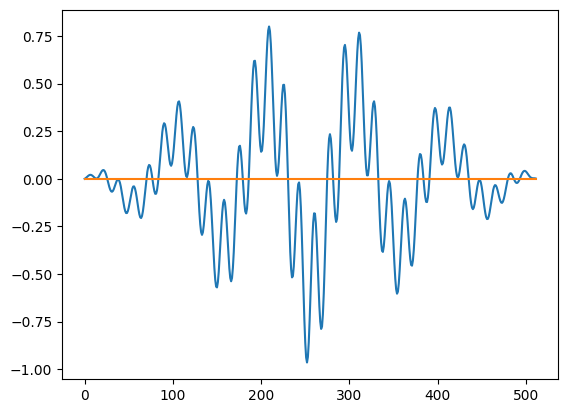

In [13]:
plot = plt.subplot(111)
sb.lineplot(np.real(ifft), ax=plot)
sb.lineplot(np.imag(ifft), ax=plot)
#plt.vlines([5.5, 30], ymin=-120, ymax=120, linestyles='dashed')

# Loading audio signal into memory dwag

In [14]:
def get_audio_data(name):
    audioData = None
    audioParams = None
    with open(name, 'rb') as f:
        wover = wave.Wave_read(f)
        frames = wover.getnframes()
        audioData = wover.readframes(frames)
        audioParams = wover.getparams()
    return audioData, audioParams, IPython.display.Audio(name)

In [16]:
data, params, player = get_audio_data('testaudio.wav')

In [17]:
player

In [18]:
samples = np.frombuffer(data, dtype=f'int{8*params.sampwidth}') / 2**(8 * params.sampwidth)
samples

array([ 0.01838684, -0.00819397,  0.02433777, ..., -0.01739502,
       -0.11854553, -0.04937744], shape=(5760000,))

Text(0, 0.5, 'amplitude')

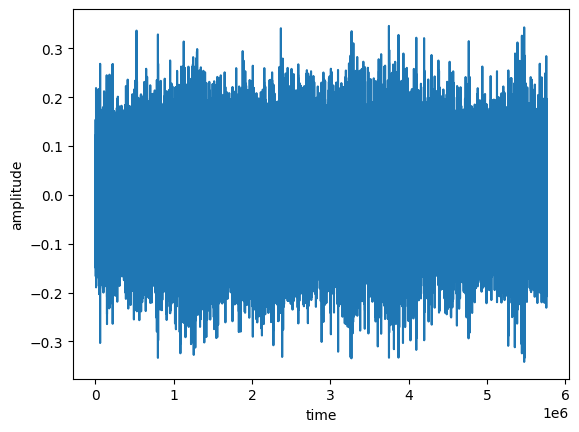

In [19]:
plot = sb.lineplot(samples)
plot.set_xlabel('time')
plot.set_ylabel('amplitude')

In [20]:
def generate_frames(data, frame_size, offset_size):
    buckets = np.zeros((len(data) // offset_size, frame_size), dtype='float64')
    for i in range(len(buckets)):
        start = i * offset_size
        stop = frame_size + start
        x = data[start : stop]
        buckets[i] = np.pad(x, pad_width = (0, frame_size - len(x)))
    return buckets

def generate_window_func(frame_size):
    return np.hanning(frame_size)
    #return np.concatenate([np.arange(frame_size//2), frame_size//2 - np.arange(frame_size//2)]) * 2 / frame_size

In [21]:
def generate_stft(buckets):
    window_mask = generate_window_func(len(buckets[0]))
    stft = np.empty(buckets.shape, dtype=np.complex64)
    for i in range(len(stft)):
        stft[i] = np.fft.fft(buckets[i] * window_mask)
    return stft

In [22]:
buckets = generate_frames(samples, 1024, 512)
stft = generate_stft(buckets)

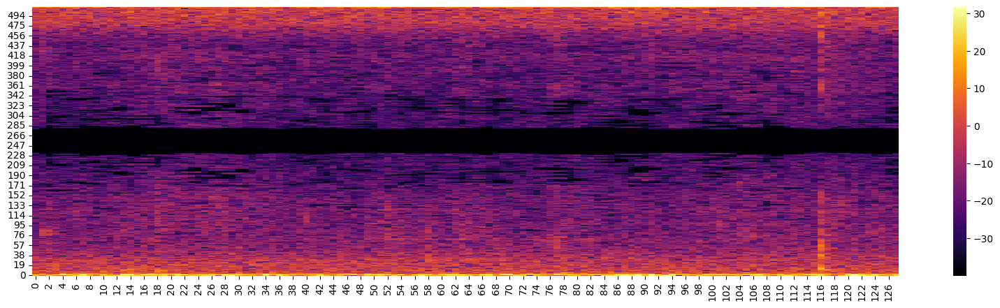

In [23]:
# Frequency in decibels
plt.figure(figsize=(20, 5))
plot = sb.heatmap(20 * np.log10(np.abs(stft)[:128].T[:512] + 0.01), cmap='inferno')
plot.invert_yaxis()

In [24]:
# Copied straight off kaggle

def freq_to_mel(freq):
    return 2595.0 * np.log10(1.0 + freq / 700.0)

def mel_to_freq(mels):
    return 700.0 * (10.0**(mels / 2595.0) - 1.0)

def get_filters(fmin, fmax, mel_filter_num, FFT_size, sample_rate=44100):
    fmin_mel = freq_to_mel(fmin)
    fmax_mel = freq_to_mel(fmax)
    
    mels = np.linspace(fmin_mel, fmax_mel, num=mel_filter_num+2)
    freqs = mel_to_freq(mels)
    
    filter_points = np.floor((FFT_size + 1) / sample_rate * freqs).astype(int)
    
    filters = np.zeros((len(filter_points)-2,int(FFT_size/2+1)))
    
    for n in range(len(filter_points)-2):
        p = filter_points[n+2] - filter_points[n]
        filters[n, filter_points[n] : filter_points[n + 1]] = np.linspace(0, 1/p, filter_points[n + 1] - filter_points[n])
        filters[n, filter_points[n + 1] : filter_points[n + 2]] = np.linspace(1/p, 0, filter_points[n + 2] - filter_points[n + 1])
    
    return filters


def get_dct(dct_filter_num, filter_len):
    basis = np.empty((dct_filter_num,filter_len))
    basis[0, :] = 1.0 / np.sqrt(filter_len)
    
    samples = np.arange(1, 2 * filter_len, 2) * np.pi / (2.0 * filter_len)

    for i in range(1, dct_filter_num):
        basis[i, :] = np.cos(i * samples) * np.sqrt(2.0 / filter_len)
        
    return basis

In [25]:
filters = get_filters(20, 20000, 1024, params.framerate)
dct = get_dct(80, len(filters[0]))

In [26]:
power = np.square(np.abs(stft)) 
mfcc = np.dot(dct, np.dot(power, filters).T)

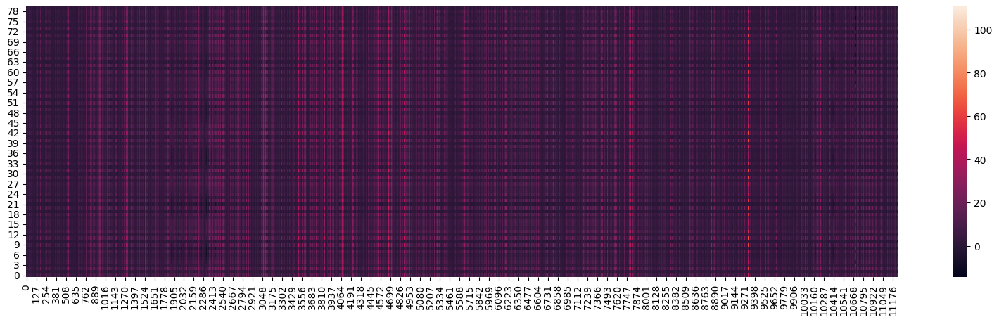

In [27]:
plt.figure(figsize=(20, 5))
sb.heatmap(mfcc).invert_yaxis()